<a href="https://colab.research.google.com/github/amirgros/46211-Deep-Learning-Project/blob/main/CNN%20based/Colorization_ResNet_UNet_conn_Perceptual.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CNN Based Image Colorizer -  with Pretrained ResNet + Long Skip Connections (UNet style) + Perceptual Loss

This implementation is based on a pre-trained ResNet18 encoder, connected with long skips to a decoder, which is partially trained to allow less consuming training. The loss function is based on L1 + Perceptual Loss. Dataset is "landscape Images" from Kaggle.\
The notebook contains functions for both regular image printing and for enhanced printing.


In [1]:
# Installs and Imports
!pip install kagglehub torch torchvision tqdm matplotlib pillow

import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torchvision.models as models
from torchvision.models import VGG16_Weights
import kagglehub
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageEnhance
from tqdm import tqdm
import glob
from sklearn.model_selection import train_test_split
import cv2



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 34.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 25.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 36.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 10.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 52.1 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitli

In [2]:
# ============ 1 ===========
# prepare data
# ==========================

# Download dataset
print("Downloading dataset...")
path = kagglehub.dataset_download("theblackmamba31/landscape-image-colorization")
print(f"Dataset downloaded to: {path}")

# Dataset class
class ColorizationDataset(Dataset):
    def __init__(self, color_paths, gray_paths, input_transform=None, target_transform=None):
        self.color_paths = color_paths
        self.gray_paths = gray_paths
        self.input_transform = input_transform
        self.target_transform = target_transform

    def __len__(self):
        return len(self.color_paths)

    def __getitem__(self, idx):
        color_img = Image.open(self.color_paths[idx]).convert('RGB')
        gray_img = Image.open(self.gray_paths[idx]).convert('RGB')

        # Different transforms for normalization
        if self.input_transform:
            gray_img = self.input_transform(gray_img)
        if self.target_transform:
            color_img = self.target_transform(color_img)

        return gray_img, color_img


# Data loading
def prepare_data():
    color_images = []
    gray_images = []

    for root, dirs, files in os.walk(path):
        if root.endswith('/color') or root.endswith('\\color') or '/color' in root or '\\color' in root:
            color_images.extend([os.path.join(root, f) for f in files if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.tiff'))])
        elif root.endswith('/gray') or root.endswith('\\gray') or '/gray' in root or '\\gray' in root:
            gray_images.extend([os.path.join(root, f) for f in files if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.tiff'))])

    print(f"Found {len(color_images)} color images and {len(gray_images)} grayscale images")

    color_images.sort()
    gray_images.sort()

    # validate pairs num
    min_len = min(len(color_images), len(gray_images))
    if min_len == 0:
        raise ValueError("No matching color and grayscale image pairs found. Check dataset structure.")

    color_images = color_images[:min_len]
    gray_images = gray_images[:min_len]

    return color_images, gray_images



100%|██████████| 192M/192M [00:02<00:00, 78.3MB/s]

Extracting files...


Dataset downloaded to: /root/.cache/kagglehub/datasets/theblackmamba31/landscape-image-colorization/versions/4


In [3]:
input_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # for the pre-trained resnet
])

# normalization to [-1, 1] for tanh
target_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])


color_paths, gray_paths = prepare_data()

train_color, test_color, train_gray, test_gray = train_test_split(
    color_paths, gray_paths, test_size=0.2, random_state=42
)

print(f"Training samples: {len(train_color)}")
print(f"Test samples: {len(test_color)}")

train_dataset = ColorizationDataset(train_color, train_gray,
                                  input_transform=input_transform,
                                  target_transform=target_transform)
test_dataset = ColorizationDataset(test_color, test_gray,
                                 input_transform=input_transform,
                                 target_transform=target_transform)


batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2)


Found 7129 color images and 7129 grayscale images
Training samples: 5703
Test samples: 1426


In [4]:
# ============ 2 ===========
# loss
# ==========================

class PerceptualLoss(nn.Module):
    def __init__(self):
        super(PerceptualLoss, self).__init__()
        vgg = models.vgg16(weights=VGG16_Weights.IMAGENET1K_V1)
        self.features = vgg.features[:16]  # Use up to conv3_3
        for param in self.features.parameters():
            param.requires_grad = False
        self.features.eval()

    def forward(self, pred, target):
        pred_features = self.features(pred)
        target_features = self.features(target)
        return nn.functional.mse_loss(pred_features, target_features)



In [5]:
# ============ 3 ===========
# define net
# ==========================

class ResNetUNet(nn.Module):
    def __init__(self):
        super(ResNetUNet, self).__init__()

        resnet = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)

        # Freeze ALL encoder parameters
        for param in resnet.parameters():
            param.requires_grad = False

        # Encoder layers - seperaed for long skips
        self.encoder1 = nn.Sequential(resnet.conv1, resnet.bn1, resnet.relu, resnet.maxpool)
        self.encoder2 = resnet.layer1
        self.encoder3 = resnet.layer2
        self.encoder4 = resnet.layer3
        self.encoder5 = resnet.layer4

        # Decoder
        self.decoder5 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bicubic', align_corners=True),
            nn.Conv2d(512, 256, 3, 1, 1),
            nn.GroupNorm(8, 256),
            nn.ReLU(inplace=True)
        )
        self.decoder4 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bicubic', align_corners=True),
            nn.Conv2d(256 + 256, 128, 3, 1, 1),
            nn.GroupNorm(8, 128),
            nn.ReLU(inplace=True)
        )
        self.decoder3 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bicubic', align_corners=True),
            nn.Conv2d(128 + 128, 64, 3, 1, 1),
            nn.GroupNorm(8, 64),
            nn.ReLU(inplace=True)
        )
        self.decoder2 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bicubic', align_corners=True),
            nn.Conv2d(64 + 64, 64, 3, 1, 1),
            nn.GroupNorm(4, 64),
            nn.ReLU(inplace=True)
        )
        self.decoder1 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bicubic', align_corners=True),
            nn.Conv2d(64, 32, 3, 1, 1),
            nn.GroupNorm(4, 32),
            nn.ReLU(inplace=True)
        )
        self.refine = nn.Sequential(
            nn.Conv2d(32, 32, 3, 1, 1),
            nn.GroupNorm(4, 32),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, 32, 3, 1, 1),
            nn.GroupNorm(4, 32),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, 32, 3, 1, 1),
            nn.GroupNorm(4, 32),
            nn.ReLU(inplace=True)
        )

        self.final_conv = nn.Conv2d(32, 3, 1)
        self.tanh = nn.Tanh()

        # Freeze decoder5, decoder4
        for param in self.decoder5.parameters():
            param.requires_grad = False
        for param in self.decoder4.parameters():
            param.requires_grad = False


    def forward(self, x):
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(enc1)
        enc3 = self.encoder3(enc2)
        enc4 = self.encoder4(enc3)
        enc5 = self.encoder5(enc4)

        dec5 = self.decoder5(enc5)
        dec4 = self.decoder4(torch.cat([dec5, enc4], dim=1)) #skip
        dec3 = self.decoder3(torch.cat([dec4, enc3], dim=1)) #skip
        dec2 = self.decoder2(torch.cat([dec3, enc2], dim=1)) #skip
        dec1 = self.decoder1(dec2)

        refined = self.refine(dec1)

        out = self.final_conv(refined)
        out = self.tanh(out)

        return out

In [6]:
# ============ 4 ===========
# train
# ==========================

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = ResNetUNet().to(device)
perceptual_loss = PerceptualLoss().to(device)
l1_loss = nn.L1Loss()
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.001)

print(f"Num of model parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad)}")


def train_epoch(model, train_loader, optimizer, perceptual_loss, l1_loss, device):
    model.train()
    total_loss = 0

    pbar = tqdm(train_loader, desc="Training")
    for gray, color in pbar:
        gray, color = gray.to(device), color.to(device)
        optimizer.zero_grad()
        pred = model(gray)

        perc_loss = perceptual_loss(pred, color)
        pixel_loss = l1_loss(pred, color)
        loss = perc_loss + 0.5 * pixel_loss

        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        pbar.set_postfix({'Loss': f'{loss.item():.4f}'})

    return total_loss / len(train_loader)


def validate(model, test_loader, perceptual_loss, l1_loss, device):
    model.eval()
    total_loss = 0

    with torch.no_grad():
        for gray, color in tqdm(test_loader, desc="Validating"):
            gray, color = gray.to(device), color.to(device)

            pred = model(gray)

            perc_loss = perceptual_loss(pred, color)
            pixel_loss = l1_loss(pred, color)
            loss = perc_loss + 0.5 * pixel_loss

            total_loss += loss.item()

    return total_loss / len(test_loader)



Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 138MB/s]
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:09<00:00, 59.7MB/s]


Num of model parameters: 268131


In [7]:
# Training loop
num_epochs = 25
train_losses = []
val_losses = []

for epoch in range(num_epochs):
    print(f"\nEpoch {epoch+1}/{num_epochs}")

    # Train
    train_loss = train_epoch(model, train_loader, optimizer, perceptual_loss, l1_loss, device)
    train_losses.append(train_loss)

    # Validate
    val_loss = validate(model, test_loader, perceptual_loss, l1_loss, device)
    val_losses.append(val_loss)

    print(f"Train Loss: {train_loss:.6f}, Val Loss: {val_loss:.6f}")



Epoch 1/25


Validating: 100%|██████████| 45/45 [00:21<00:00,  2.12it/s]


Train Loss: 2.550849, Val Loss: 2.166679

Epoch 2/25


Validating: 100%|██████████| 45/45 [00:21<00:00,  2.07it/s]


Train Loss: 2.084775, Val Loss: 2.053817

Epoch 3/25


Validating: 100%|██████████| 45/45 [00:21<00:00,  2.08it/s]


Train Loss: 1.949639, Val Loss: 1.941241

Epoch 4/25


Validating: 100%|██████████| 45/45 [00:21<00:00,  2.09it/s]


Train Loss: 1.860284, Val Loss: 1.904163

Epoch 5/25


Validating: 100%|██████████| 45/45 [00:21<00:00,  2.09it/s]


Train Loss: 1.796931, Val Loss: 1.771929

Epoch 6/25


Validating: 100%|██████████| 45/45 [00:21<00:00,  2.10it/s]


Train Loss: 1.741719, Val Loss: 1.698097

Epoch 7/25


Validating: 100%|██████████| 45/45 [00:21<00:00,  2.10it/s]


Train Loss: 1.702814, Val Loss: 1.702102

Epoch 8/25


Validating: 100%|██████████| 45/45 [00:21<00:00,  2.06it/s]


Train Loss: 1.664410, Val Loss: 1.632182

Epoch 9/25


Validating: 100%|██████████| 45/45 [00:21<00:00,  2.09it/s]


Train Loss: 1.630840, Val Loss: 1.598071

Epoch 10/25


Validating: 100%|██████████| 45/45 [00:21<00:00,  2.09it/s]


Train Loss: 1.604361, Val Loss: 1.570905

Epoch 11/25


Validating: 100%|██████████| 45/45 [00:21<00:00,  2.08it/s]


Train Loss: 1.590402, Val Loss: 1.555971

Epoch 12/25


Validating: 100%|██████████| 45/45 [00:21<00:00,  2.09it/s]


Train Loss: 1.578739, Val Loss: 1.584866

Epoch 13/25


Validating: 100%|██████████| 45/45 [00:21<00:00,  2.09it/s]


Train Loss: 1.561866, Val Loss: 1.577981

Epoch 14/25


Validating: 100%|██████████| 45/45 [00:21<00:00,  2.06it/s]


Train Loss: 1.538868, Val Loss: 1.542721

Epoch 15/25


Validating: 100%|██████████| 45/45 [00:21<00:00,  2.08it/s]


Train Loss: 1.526187, Val Loss: 1.535446

Epoch 16/25


Validating: 100%|██████████| 45/45 [00:21<00:00,  2.09it/s]


Train Loss: 1.515844, Val Loss: 1.488033

Epoch 17/25


Validating: 100%|██████████| 45/45 [00:21<00:00,  2.09it/s]


Train Loss: 1.505286, Val Loss: 1.596531

Epoch 18/25


Validating: 100%|██████████| 45/45 [00:21<00:00,  2.09it/s]


Train Loss: 1.504072, Val Loss: 1.503775

Epoch 19/25


Validating: 100%|██████████| 45/45 [00:21<00:00,  2.09it/s]


Train Loss: 1.491241, Val Loss: 1.506829

Epoch 20/25


Validating: 100%|██████████| 45/45 [00:21<00:00,  2.06it/s]


Train Loss: 1.476672, Val Loss: 1.457602

Epoch 21/25


Validating: 100%|██████████| 45/45 [00:21<00:00,  2.09it/s]


Train Loss: 1.482193, Val Loss: 1.466666

Epoch 22/25


Validating: 100%|██████████| 45/45 [00:21<00:00,  2.09it/s]


Train Loss: 1.472447, Val Loss: 1.441688

Epoch 23/25


Validating: 100%|██████████| 45/45 [00:21<00:00,  2.09it/s]


Train Loss: 1.460889, Val Loss: 1.461179

Epoch 24/25


Validating: 100%|██████████| 45/45 [00:21<00:00,  2.09it/s]


Train Loss: 1.463818, Val Loss: 1.462595

Epoch 25/25


Validating: 100%|██████████| 45/45 [00:21<00:00,  2.10it/s]

Train Loss: 1.454070, Val Loss: 1.461470


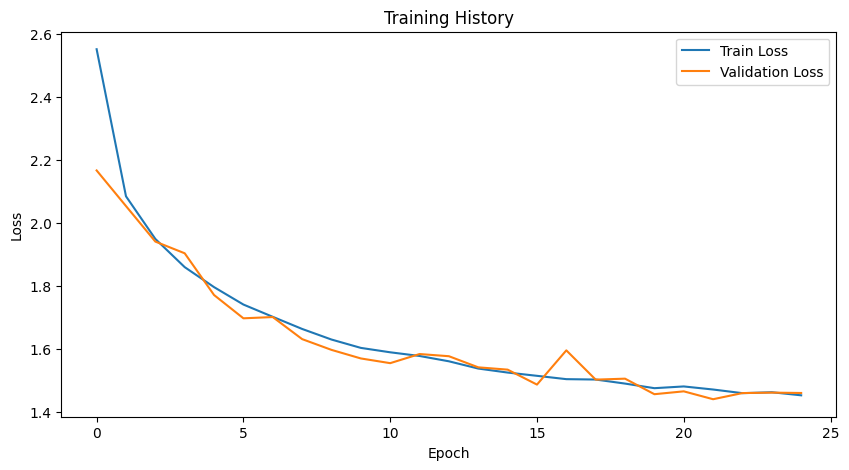

In [8]:
# Plot training history
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training History')
plt.legend()
plt.show()

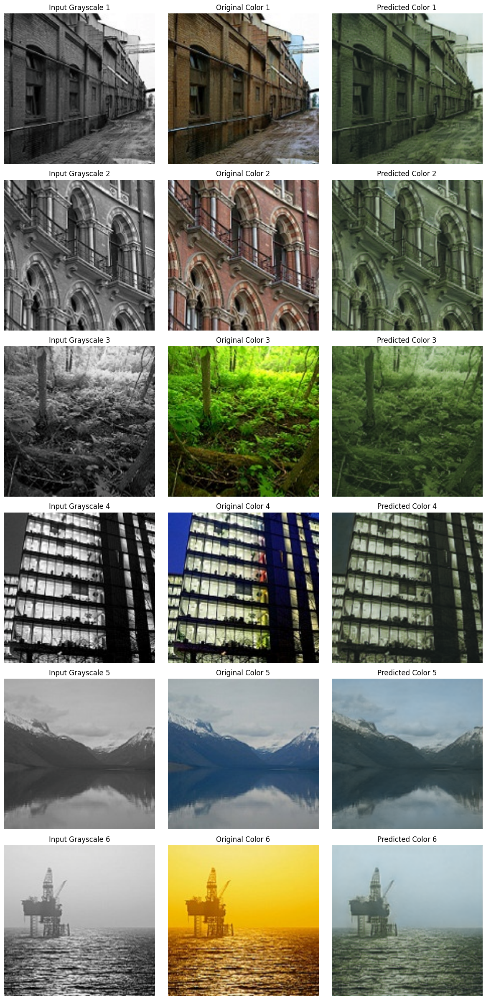

In [9]:
# ============ 5 ===========
# show results
# ==========================

def denormalize_input(tensor):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1).to(tensor.device)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1).to(tensor.device)
    return tensor * std + mean

def denormalize_target(tensor):
    return (tensor + 1.0) / 2.0


def show_results(model, test_loader, device, num_samples=6):
    model.eval()

    with torch.no_grad():
        for gray_batch, color_batch in test_loader:
            gray_batch, color_batch = gray_batch.to(device), color_batch.to(device)
            pred_batch = model(gray_batch)

            num_to_show = min(num_samples, gray_batch.size(0))
            fig, axes = plt.subplots(num_to_show, 3, figsize=(12, 4*num_to_show))
            if num_to_show == 1:
                axes = axes.reshape(1, -1)

            for i in range(num_to_show):
                gray_single = gray_batch[i].cpu()
                color_single = color_batch[i].cpu()
                pred_single = pred_batch[i].cpu()

                gray_denorm = denormalize_input(gray_single)
                color_denorm = denormalize_target(color_single)
                pred_denorm = denormalize_target(pred_single)

                gray_denorm = torch.clamp(gray_denorm, 0, 1)
                color_denorm = torch.clamp(color_denorm, 0, 1)
                pred_denorm = torch.clamp(pred_denorm, 0, 1)

                gray_img = transforms.ToPILImage()(gray_denorm)
                color_img = transforms.ToPILImage()(color_denorm)
                pred_img = transforms.ToPILImage()(pred_denorm)

                axes[i, 0].imshow(gray_img)
                axes[i, 0].set_title(f'Input Grayscale {i+1}')
                axes[i, 0].axis('off')

                axes[i, 1].imshow(color_img)
                axes[i, 1].set_title(f'Original Color {i+1}')
                axes[i, 1].axis('off')

                axes[i, 2].imshow(pred_img)
                axes[i, 2].set_title(f'Predicted Color {i+1}')
                axes[i, 2].axis('off')

            plt.tight_layout()
            plt.show()
            break  # Only first batch

show_results(model, test_loader, device)


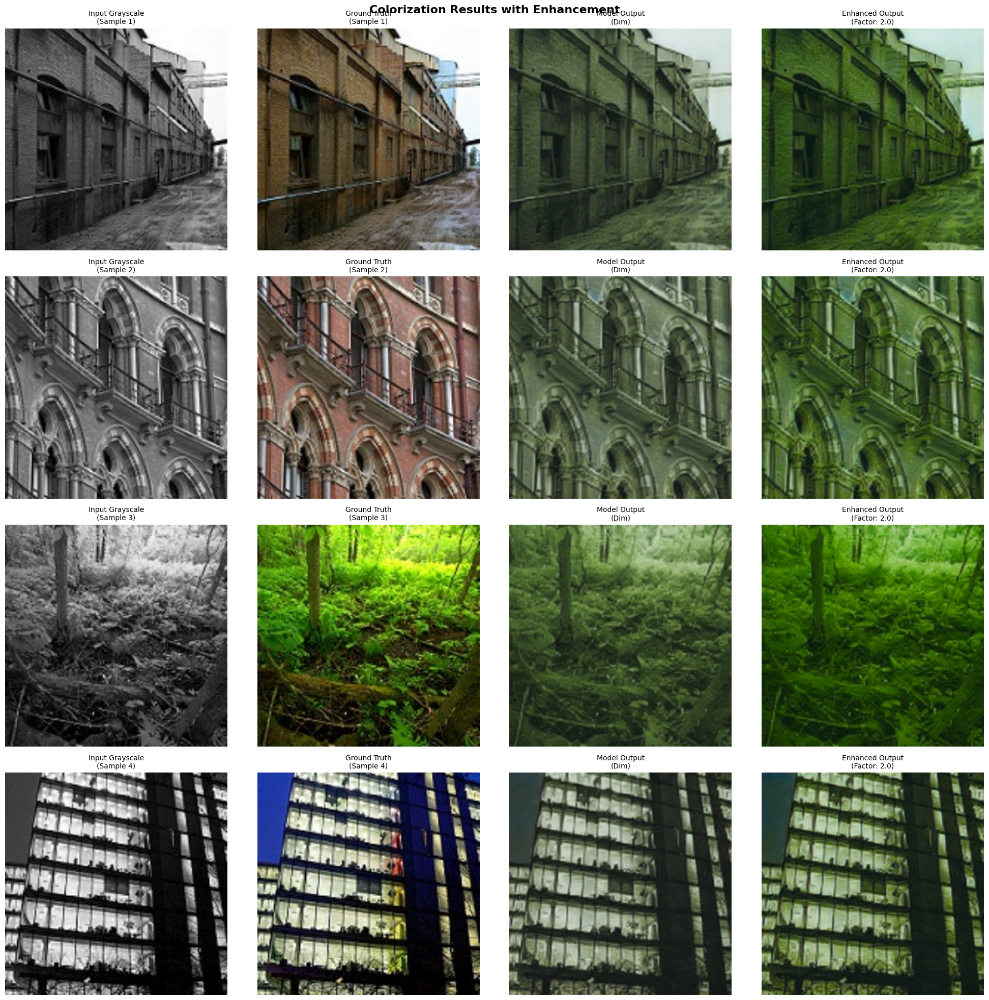

In [10]:
def enhance_colors(image_tensor, factor=1.5):
    if isinstance(image_tensor, torch.Tensor):
        image_tensor = torch.clamp(image_tensor, 0, 1)
        pil_image = transforms.ToPILImage()(image_tensor)
    else:
        pil_image = image_tensor

    img_array = np.array(pil_image)
    hsv = cv2.cvtColor(img_array, cv2.COLOR_RGB2HSV).astype(np.float32)
    hsv[:, :, 1] *= factor
    hsv[:, :, 1] = np.clip(hsv[:, :, 1], 0, 255)
    enhanced = cv2.cvtColor(hsv.astype(np.uint8), cv2.COLOR_HSV2RGB)
    return Image.fromarray(enhanced)



def show_results_enhanced_colors(model, test_loader, device, num_samples=6, enhance_factor=2.0):
    model.eval()

    with torch.no_grad():
        for gray_batch, color_batch in test_loader:
            gray_batch, color_batch = gray_batch.to(device), color_batch.to(device)
            pred_batch = model(gray_batch)

            num_to_show = min(num_samples, gray_batch.size(0))

            fig, axes = plt.subplots(num_to_show, 4, figsize=(20, 5*num_to_show))
            fig.suptitle('Colorization Results with Enhancement', fontsize=16, fontweight='bold')

            if num_to_show == 1:
                axes = axes.reshape(1, -1)

            for i in range(num_to_show):
                gray_single = gray_batch[i].cpu()
                color_single = color_batch[i].cpu()
                pred_single = pred_batch[i].cpu()

                gray_denorm = denormalize_input(gray_single)
                color_denorm = denormalize_target(color_single)
                pred_denorm = denormalize_target(pred_single)

                gray_denorm = torch.clamp(gray_denorm, 0, 1)
                color_denorm = torch.clamp(color_denorm, 0, 1)
                pred_denorm = torch.clamp(pred_denorm, 0, 1)

                gray_img = transforms.ToPILImage()(gray_denorm)
                color_img = transforms.ToPILImage()(color_denorm)
                pred_img = transforms.ToPILImage()(pred_denorm)

                # enhancment
                pred_enhanced = enhance_colors(pred_denorm, factor=enhance_factor)

                axes[i, 0].imshow(gray_img)
                axes[i, 0].set_title(f'Input Grayscale\n(Sample {i+1})', fontsize=10)
                axes[i, 0].axis('off')

                axes[i, 1].imshow(color_img)
                axes[i, 1].set_title(f'Ground Truth\n(Sample {i+1})', fontsize=10)
                axes[i, 1].axis('off')

                axes[i, 2].imshow(pred_img)
                axes[i, 2].set_title(f'Model Output\n(Dim)', fontsize=10)
                axes[i, 2].axis('off')

                axes[i, 3].imshow(pred_enhanced)
                axes[i, 3].set_title(f'Enhanced Output\n(Factor: {enhance_factor})', fontsize=10)
                axes[i, 3].axis('off')

            plt.tight_layout()
            plt.show()
            break


show_results_enhanced_colors(model, test_loader, device, num_samples=4, enhance_factor=2.0)